## Medidas de centralización

- Media -> Promedio
- Mediana -> Ordenar asc y el valor de en medio es la mediana (promedio de los elementos del centro si es un arreglo de longitud par)
- Moda -> Dato que más se repite
- Percentil -> Quantiles (distribución de los objetos)

## Medidas de dispersión
- Varianza ->  Como los valores se desplazan con respecto de la media
- Desviación típica -> Raíz cuadrada de la varianza
- Coeficiente de variación -> Desviación típica/Media

## Medidas de asimetría
- Momento de orden r -> Diferencia de los elementos a la r
- asimetría de Fisher -> Momento de orden 3
- curtosis -> Momento de orden 4

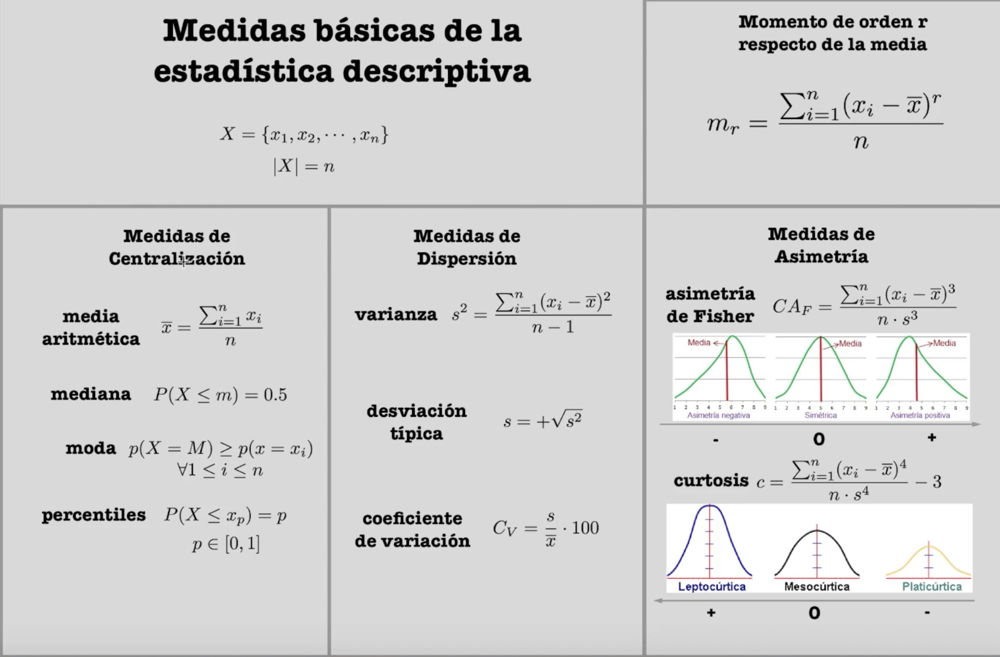

In [6]:
# from wand.image import Image as WImage
# pdf = WImage(filename='resources/statistics_concepts.pdf')
# pdf
from IPython.display import Image
Image(filename='resources/statistics-1.png')

## Muestreo aleatorio y Teorema central del límite
Los datos que se toman al principio tienen una distribución desconocida, pero en cada muestra se conoce.
La media de las medias tiene una distribución conocida.

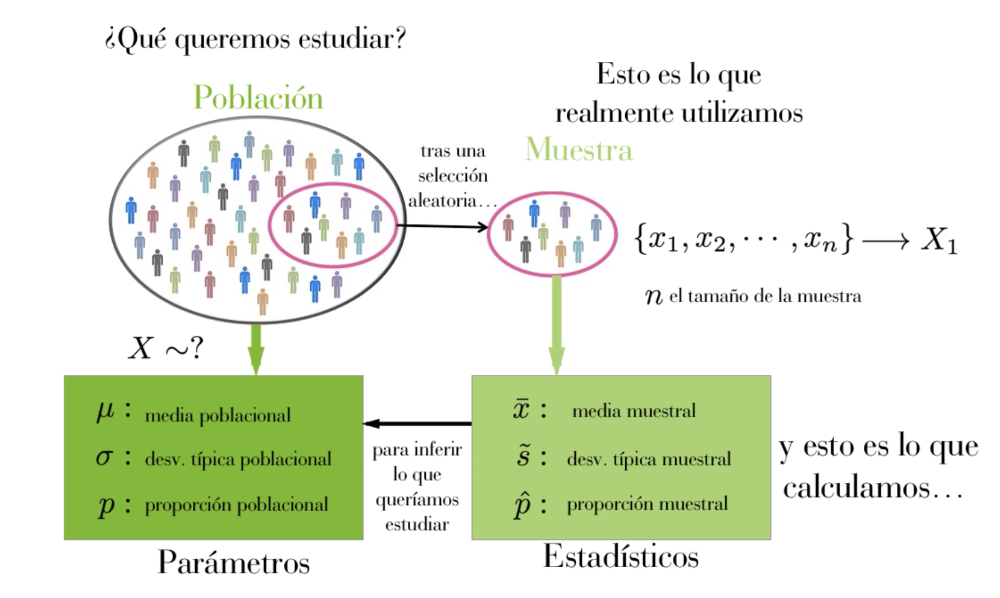

In [9]:
Image(filename='resources/statistics-2.png')

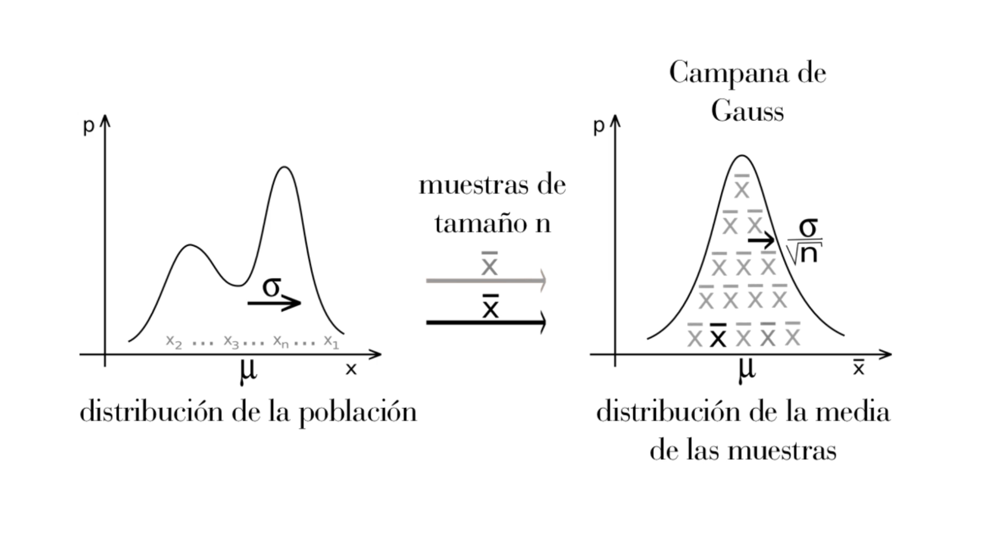

In [10]:
Image(filename='resources/statistics-3.png')

## Contraste de hipótesis

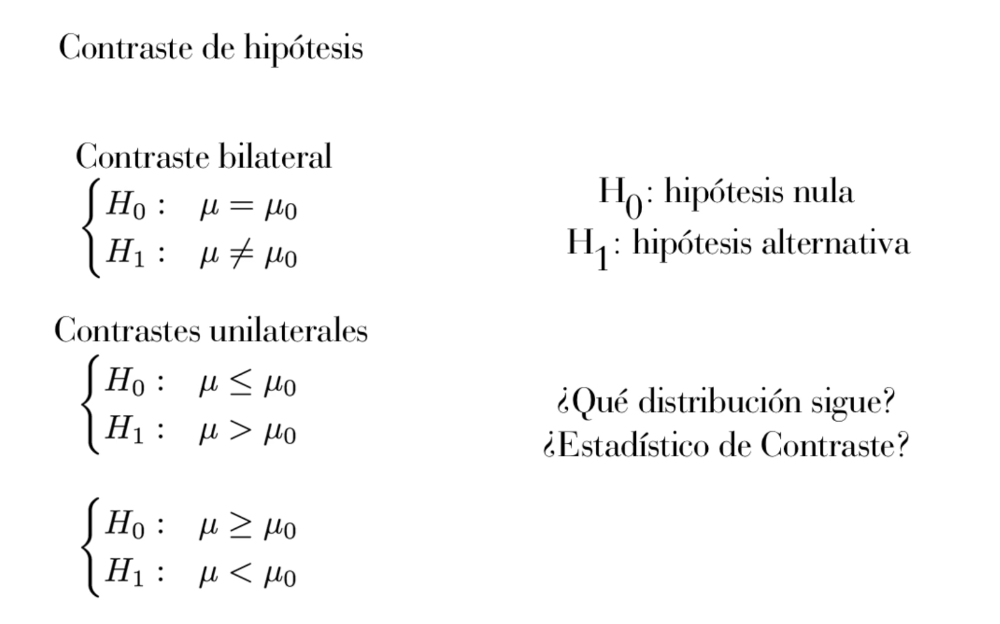

In [11]:
Image(filename='resources/statistics-4.png')

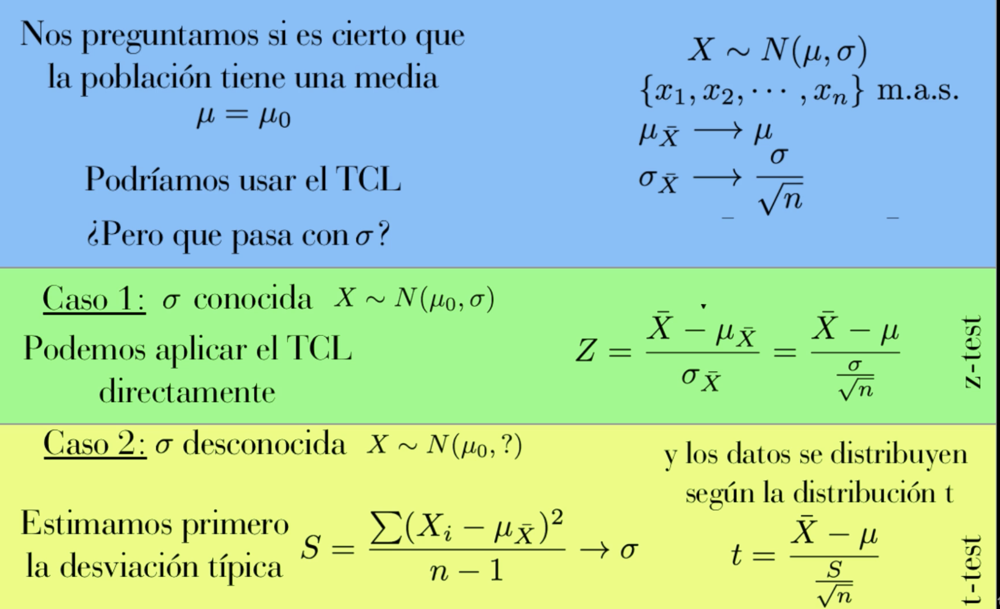

In [12]:
Image(filename='resources/statistics-5.png')

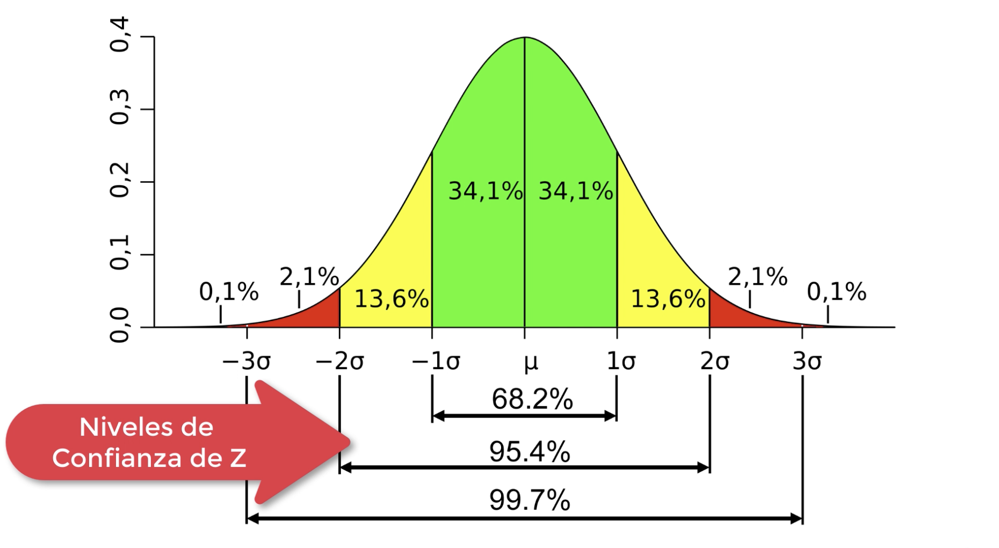

In [13]:
Image(filename='resources/statistics-7.png')

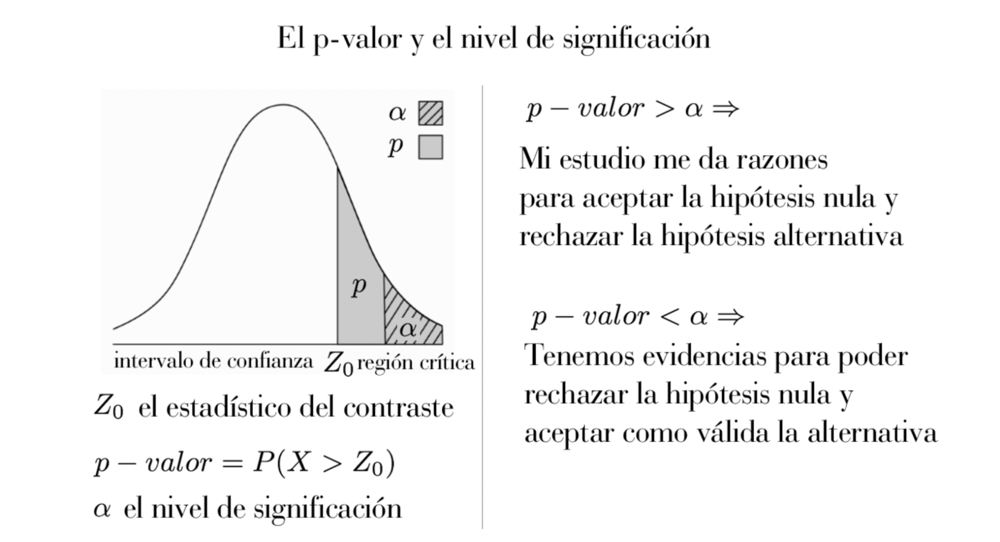

In [14]:
Image(filename='resources/statistics-8.png')

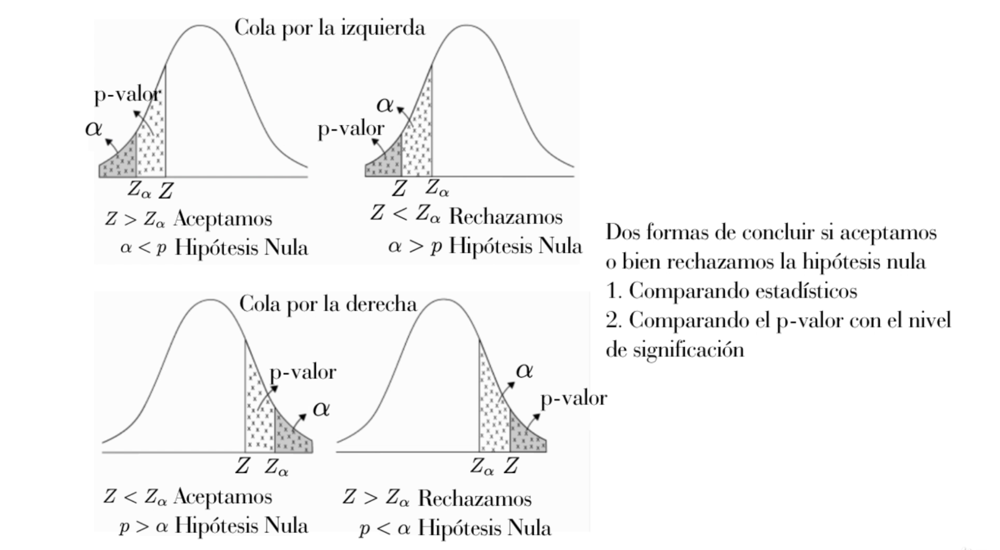

In [15]:
Image(filename='resources/statistics-9.png')

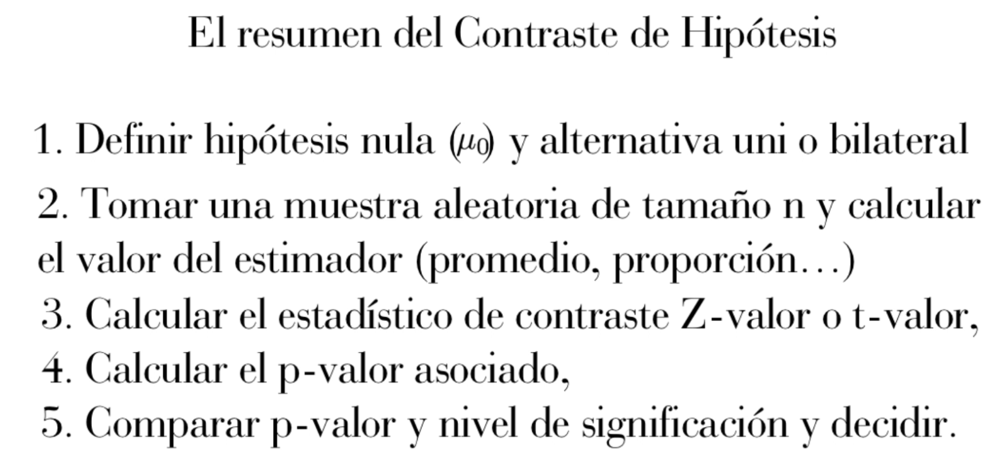

In [16]:
Image(filename='resources/statistics-10.png')

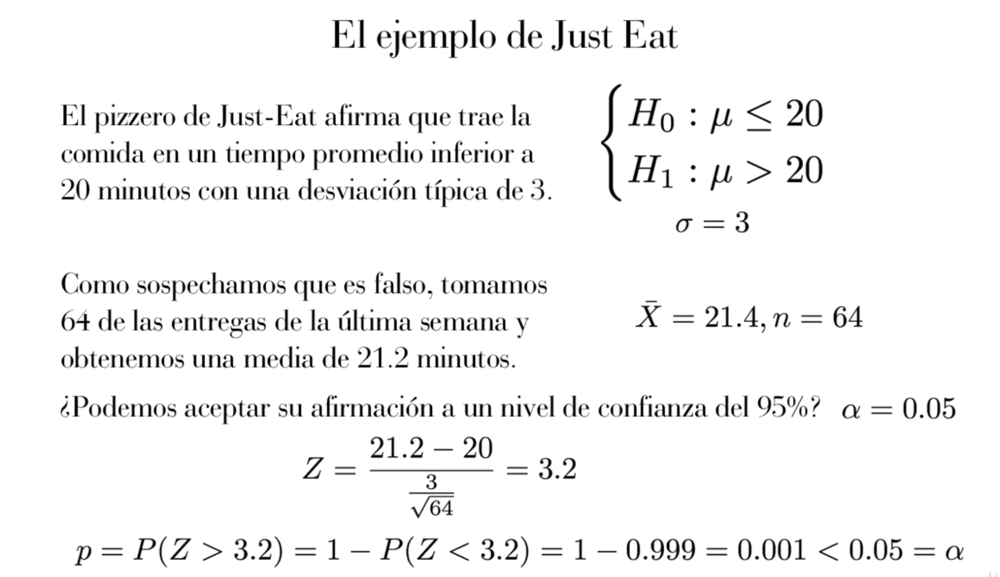

In [17]:
Image(filename='resources/statistics-11.png')

## Test de la Chi Cuadrado

Comprobar que los datos vienen de una fuente conocida. 

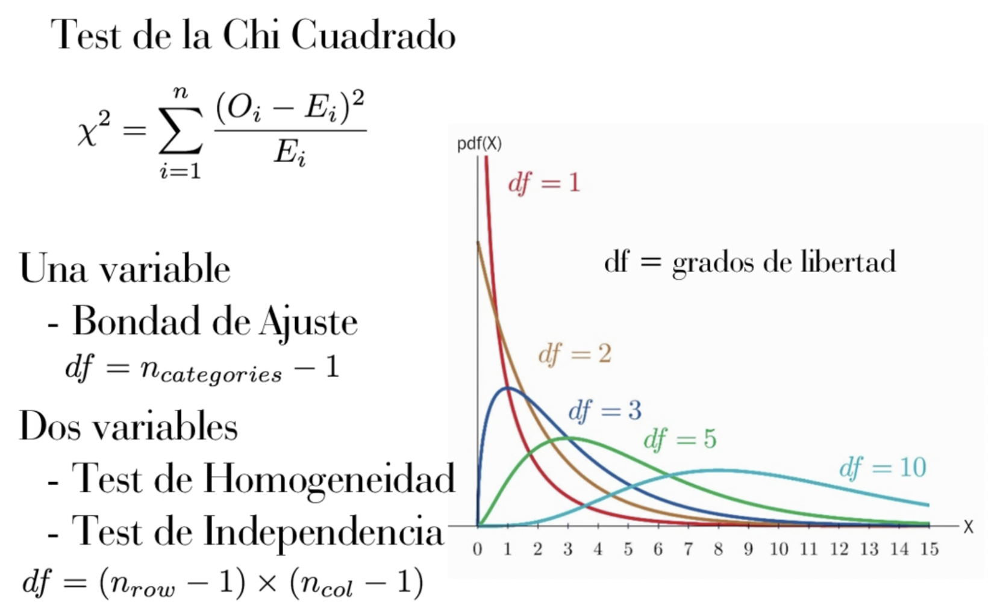

In [18]:
Image(filename='resources/statistics-12.png')

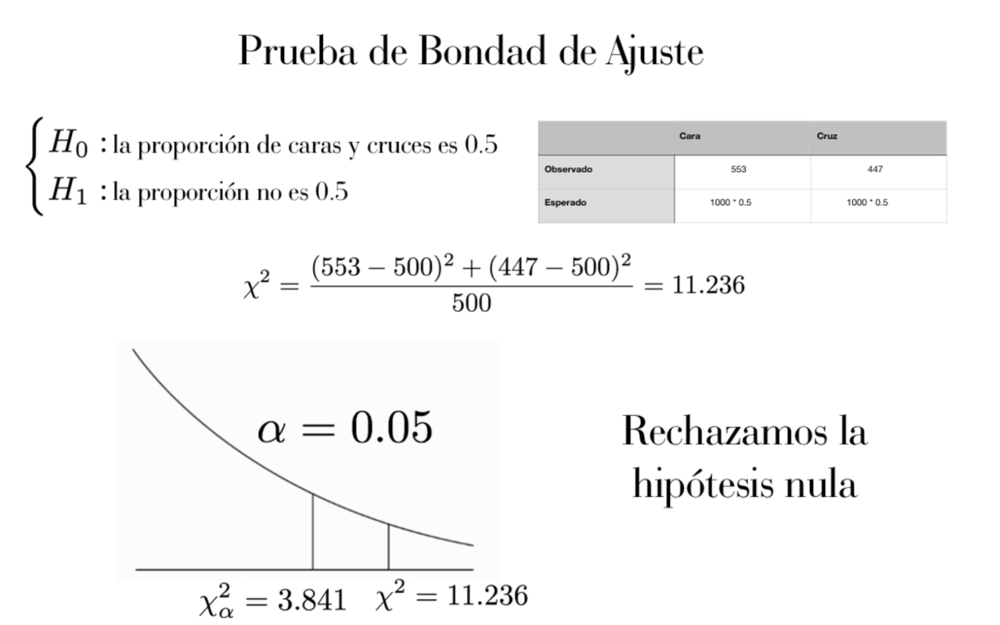

In [19]:
Image(filename='resources/statistics-13.png')

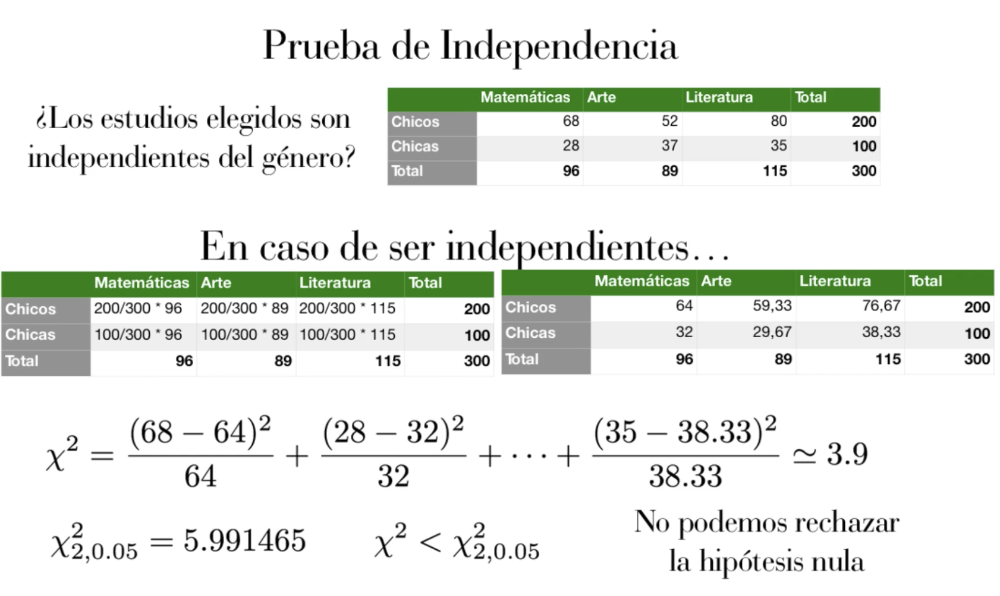

In [21]:
Image(filename='resources/statistics-14.png')

## Correlación

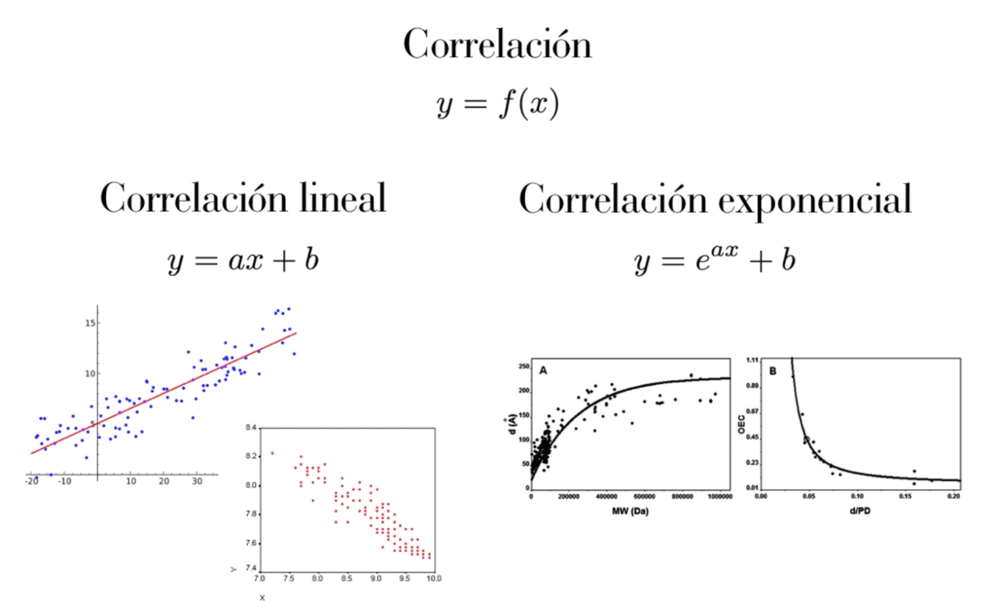

In [22]:
Image(filename='resources/statistics-15.png')

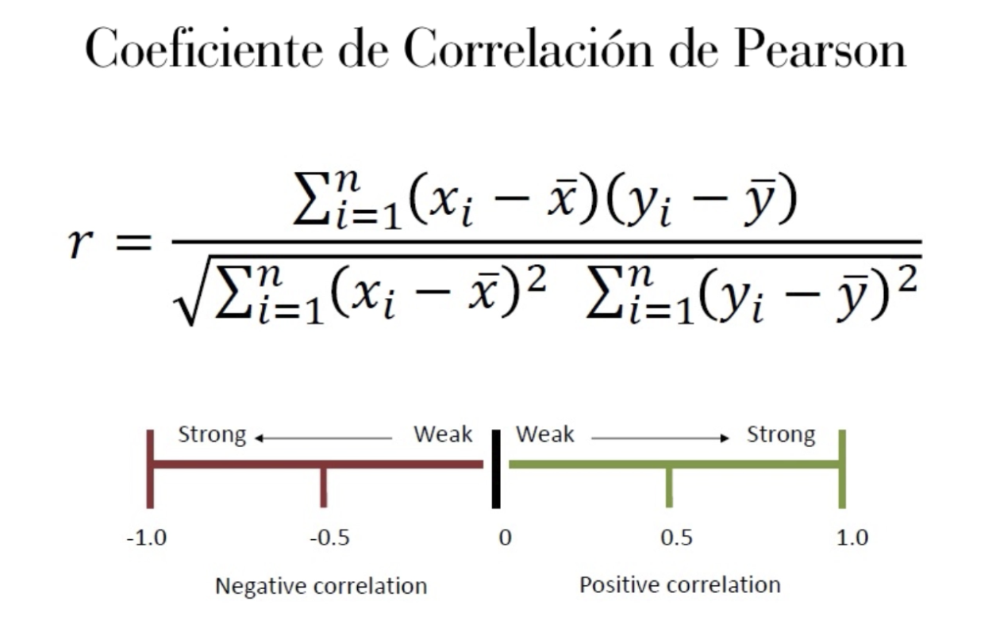

In [23]:
Image(filename='resources/statistics-16.png')

In [31]:
import pandas as pd
import numpy as np
data_ads = pd.read_csv('../datasets/ads/Advertising.csv')
print(len(data_ads), '\n', data_ads.head())

200 
       TV  Radio  Newspaper  Sales
0  230.1   37.8       69.2   22.1
1   44.5   39.3       45.1   10.4
2   17.2   45.9       69.3    9.3
3  151.5   41.3       58.5   18.5
4  180.8   10.8       58.4   12.9


In [30]:
data_ads['corrn'] = (data_ads['TV'] - np.mean(data_ads['TV'])) * (data_ads['Sales'] - np.mean(data_ads['Sales']))
data_ads.head()

,TV,Radio,Newspaper,Sales,corrn
0,230.1,37.8,69.2,22.1,670.896956
1,44.5,39.3,45.1,10.4,371.460206
2,17.2,45.9,69.3,9.3,613.181206
3,151.5,41.3,58.5,18.5,19.958456
4,180.8,10.8,58.4,12.9,-37.892794


In [26]:
data_ads['corrn1'] = (data_ads['TV'] - np.mean(data_ads['TV'])) ** 2
data_ads.head()

,TV,Radio,Newspaper,Sales,corrn,corrn1
0,230.1,37.8,69.2,22.1,670.896956,6898.548306
1,44.5,39.3,45.1,10.4,371.460206,10514.964306
2,17.2,45.9,69.3,9.3,613.181206,16859.074806
3,151.5,41.3,58.5,18.5,19.958456,19.869306
4,180.8,10.8,58.4,12.9,-37.892794,1139.568806


In [27]:
data_ads['corrn2'] = (data_ads['Sales'] - np.mean(data_ads['Sales'])) ** 2
data_ads.head()

,TV,Radio,Newspaper,Sales,corrn,corrn1,corrn2
0,230.1,37.8,69.2,22.1,670.896956,6898.548306,65.246006
1,44.5,39.3,45.1,10.4,371.460206,10514.964306,13.122506
2,17.2,45.9,69.3,9.3,613.181206,16859.074806,22.302006
3,151.5,41.3,58.5,18.5,19.958456,19.869306,20.048006
4,180.8,10.8,58.4,12.9,-37.892794,1139.568806,1.260006


In [28]:
corrn = sum(data_ads['corrn']) / np.sqrt(sum(data_ads['corrn1']) * sum(data_ads['corrn2']))
corrn

0.782224424861606

In [32]:
def corr_coeficent(df, var1, var2):
    df['corrn'] = (df[var1] - np.mean(df[var1])) * (df[var2] - np.mean(df[var2]))
    df['corrn1'] = (df[var1] - np.mean(data_ads[var1])) ** 2
    df['corrn2'] = (df[var2] - np.mean(data_ads[var2])) ** 2
    corrn = sum(df['corrn']) / np.sqrt(sum(df['corrn1']) * sum(df['corrn2']))
    return corrn

cols = data_ads.columns.values

for x in cols:
    for y in cols:
        print(x + ', ' + y + ': ' + str(corr_coeficent(data_ads, x, y)))

TV, TV: 1.0
TV, Radio: 0.05480866446583006
TV, Newspaper: 0.056647874965056993
TV, Sales: 0.782224424861606
Radio, TV: 0.05480866446583006
Radio, Radio: 1.0
Radio, Newspaper: 0.35410375076117545
Radio, Sales: 0.576222574571055
Newspaper, TV: 0.056647874965056993
Newspaper, Radio: 0.35410375076117545
Newspaper, Newspaper: 1.0
Newspaper, Sales: 0.22829902637616534
Sales, TV: 0.782224424861606
Sales, Radio: 0.576222574571055
Sales, Newspaper: 0.22829902637616534
Sales, Sales: 1.0


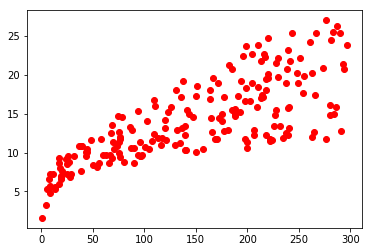

In [34]:
import matplotlib.pyplot as plt
plt.plot(data_ads['TV'], data_ads['Sales'], 'ro')

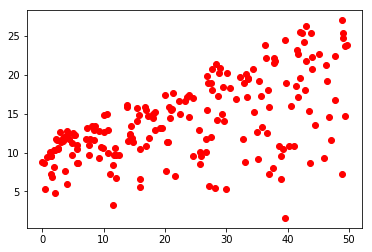

In [36]:
plt.plot(data_ads['Radio'], data_ads['Sales'], 'ro')

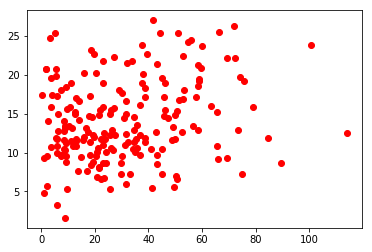

In [38]:
plt.plot(data_ads['Newspaper'], data_ads['Sales'], 'ro')

In [39]:
data_ads.corr()

,TV,Radio,Newspaper,Sales,corrn,corrn1,corrn2
TV,1.000000,0.054809,0.056648,0.782224,0.075915,0.075915,0.075915
Radio,0.054809,1.000000,0.354104,0.576223,0.402556,0.402556,0.402556
Newspaper,0.056648,0.354104,1.000000,0.228299,0.142256,0.142256,0.142256
Sales,0.782224,0.576223,0.228299,1.000000,0.322686,0.322686,0.322686
corrn,0.075915,0.402556,0.142256,0.322686,1.000000,1.000000,1.000000
corrn1,0.075915,0.402556,0.142256,0.322686,1.000000,1.000000,1.000000
corrn2,0.075915,0.402556,0.142256,0.322686,1.000000,1.000000,1.000000


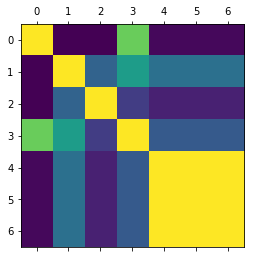

In [40]:
plt.matshow(data_ads.corr())